# **Imports**

In [14]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import copy
import time
from tqdm import tqdm
import os
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:

!pip install timm

In [3]:
!tar -xvzf /kaggle/input/200-bird-species-with-11788-images/CUB_200_2011.tgz

tar (child): /kaggle/input/200-bird-species-with-11788-images/CUB_200_2011.tgz: Cannot open: No such file or directory
tar (child): Error is not recoverable: exiting now
tar: Child returned status 2
tar: Error is not recoverable: exiting now


# **Pytorch Imports**

In [15]:
import torch
import torchvision
from torchvision import datasets, transforms,models
from torch import nn, optim
from torch.nn import functional as F
from torch.utils.data import DataLoader, sampler, random_split
import timm
from timm.loss import LabelSmoothingCrossEntropy
from timm.data import create_transform
from PIL import Image
from io import BytesIO
import requests

In [16]:
import warnings
warnings.filterwarnings("ignore")

# **Loading Dataset**

In [18]:
# Connect to Google Drive for data access
import os
import tarfile
from google.colab import drive
from torchvision import datasets

drive.mount("/content/drive")

# Location of compressed file and destination
compressed_file = "/content/drive/MyDrive/archive/CUB_200_2011.tgz"
unpacked_dir = "/content/drive/MyDrive/archive/CUB_200_2011"

# Decompress only once
def unpack_data(src, dst):
    if os.path.isdir(dst):
        print("Dataset already extracted")
    else:
        with tarfile.open(src, "r:gz") as f:
            f.extractall(dst)
        print("Extracted dataset")

unpack_data(compressed_file, unpacked_dir)

# Collect class labels from dataset
def get_class_labels(root_folder):
    folder_data = datasets.ImageFolder(root_folder)
    return folder_data.classes

# Final path to training images
img_root = os.path.join(unpacked_dir, "CUB_200_2011", "images")

print(f"Number of classes: {len(get_class_labels(img_root))}")
print(get_class_labels(img_root)[:10])  # preview first 10 classes



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Dataset already extracted
Number of classes: 200
['001.Black_footed_Albatross', '002.Laysan_Albatross', '003.Sooty_Albatross', '004.Groove_billed_Ani', '005.Crested_Auklet', '006.Least_Auklet', '007.Parakeet_Auklet', '008.Rhinoceros_Auklet', '009.Brewer_Blackbird', '010.Red_winged_Blackbird']


In [19]:
# Build dataset transforms depending on training or evaluation
def build_transforms(is_training):
    if is_training:
        return transforms.Compose([
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.RandomVerticalFlip(p=0.5),
            transforms.RandomApply(torch.nn.ModuleList([transforms.ColorJitter()]), p=0.1),
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize((0.485, 0.456, 0.406),
                                 (0.229, 0.224, 0.225)),
            # transforms.RandomErasing(p=0.25, value='random')
        ])
    else:
        return transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize((0.485, 0.456, 0.406),
                                 (0.229, 0.224, 0.225)),
        ])


# Compute dataset split sizes
def compute_split_sizes(total_samples, train_fraction):
    train_size = int(total_samples * train_fraction)
    valid_size = int((total_samples - train_size) / 2)
    test_size = total_samples - train_size - valid_size
    return train_size, valid_size, test_size


# Main function that returns data loaders
def get_data_loaders(data_dir, batch_size, train=False):
    transform_pipeline = build_transforms(train)
    dataset_complete = datasets.ImageFolder(data_dir, transform=transform_pipeline)

    total = len(dataset_complete)
    split_ratio = 0.75 if train else 0.70
    num_train, num_valid, num_test = compute_split_sizes(total, split_ratio)

    part_train, part_valid, part_test = random_split(dataset_complete, [num_train, num_valid, num_test])

    if train:
        loader_train = DataLoader(part_train, batch_size=batch_size, shuffle=True, num_workers=4)
        return loader_train, num_train
    else:
        loader_valid = DataLoader(part_valid, batch_size=batch_size, shuffle=True, num_workers=4)
        loader_test = DataLoader(part_test, batch_size=batch_size, shuffle=True, num_workers=4)
        return loader_valid, loader_test, num_valid, num_test


In [20]:
# Prepare datasets
path_images = "/content/drive/MyDrive/archive/CUB_200_2011/CUB_200_2011/images"

train_loader, count_train = get_data_loaders(path_images, 256, train=True)
valid_loader, test_loader, count_valid, count_test = get_data_loaders(path_images, 64, train=False)

# Class labels
classes = get_class_labels(path_images)

print(f"Number of classes: {len(classes)}")
print("Sample classes:", classes[:10])  # preview first 10


Number of classes: 200
Sample classes: ['001.Black_footed_Albatross', '002.Laysan_Albatross', '003.Sooty_Albatross', '004.Groove_billed_Ani', '005.Crested_Auklet', '006.Least_Auklet', '007.Parakeet_Auklet', '008.Rhinoceros_Auklet', '009.Brewer_Blackbird', '010.Red_winged_Blackbird']


In [21]:
dataset_sizes = {
    "train": count_train,
    "val": count_valid
}
dataloaders = {
    "train": train_loader,
    "val": valid_loader
}

In [22]:
print(len(train_loader))
print(len(valid_loader))
print(len(test_loader))

35
28
28


# **Displaying Sample Data**

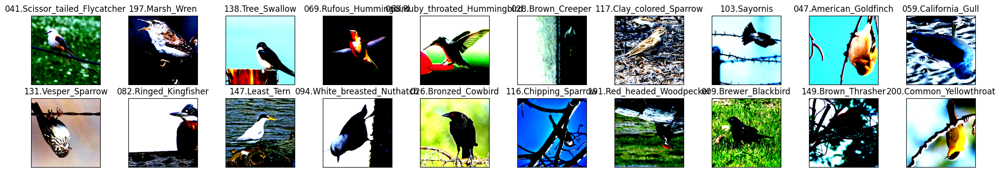

In [11]:
data_iter = iter(train_loader)
images, labels = next(data_iter)
images = images.numpy()

fig = plt.figure(figsize=(25, 4))
for idx in np.arange(20):
    ax = fig.add_subplot(2, 10, idx + 1, xticks=[], yticks=[])
    plt.imshow(np.transpose(images[idx], (1, 2, 0)))
    ax.set_title(classes[labels[idx]])

In [30]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cpu'

In [29]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [31]:
# Enable optimized CuDNN
torch.backends.cudnn.benchmark = True

# Load backbone
model_cnn = torchvision.models.resnet18(pretrained=True)

# Freeze backbone
for param in model_cnn.parameters():
    param.requires_grad = False

# Replace FC head
fc_inputs = model_cnn.fc.in_features
new_fc = nn.Sequential(
    nn.Linear(fc_inputs, 1024),
    nn.SiLU(),
    nn.Dropout(0.3),
    nn.Linear(1024, 2048),
    nn.SiLU(),
    nn.Dropout(0.3),
    nn.Linear(2048, 2048),
    nn.SiLU(),
    nn.Dropout(0.3),
    nn.Linear(2048, len(classes))
)
model_cnn.fc = new_fc

# Move to device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_cnn = model_cnn.to(device)

In [32]:
print(f"Trainable Params: {count_parameters(model_cnn)}")

Trainable Params: 7230664


# **Displaying Model Information**

In [33]:
print(model_cnn)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [34]:
# Loss function with label smoothing
criterion = nn.CrossEntropyLoss(label_smoothing=0.2).to(device)

# Optimizer (AdamW on final fully connected/classifier layer)
optimizer = optim.AdamW(model_cnn.fc.parameters(), lr=0.001)

In [35]:
train_history = {'accuracy':[],'loss':[]}
val_history = {'accuracy':[],'loss':[]}

In [36]:
lr_scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=4, gamma=0.96)

In [37]:
def train_model(model_cnn, criterion, optimizer, lr_scheduler, num_epochs=25):
    start_time = time.time()

    # keep best weights
    best_weights = copy.deepcopy(model_cnn.state_dict())
    best_val_acc = 0.0

    for epoch in range(num_epochs):
        print(f"Epoch {epoch}/{num_epochs-1}")
        print("-" * 10)

        # loop through both train and validation
        for phase in ["train", "val"]:
            if phase == "train":
                model_cnn.train()
            else:
                model_cnn.eval()

            running_loss, running_corrects = 0.0, 0

            # go through mini-batches
            for inputs, labels in tqdm(dataloaders[phase]):
                inputs, labels = inputs.to(device), labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == "train"):
                    outputs = model_cnn(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    if phase == "train":
                        loss.backward()
                        optimizer.step()

                # accumulate loss and accuracy
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            if phase == "train":
                lr_scheduler.step()

            # compute epoch stats
            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            # log history
            if phase == "train":
                train_history["accuracy"].append(epoch_acc)
                train_history["loss"].append(epoch_loss)
            else:
                val_history["accuracy"].append(epoch_acc)
                val_history["loss"].append(epoch_loss)

            print(f"{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}")

            # store best weights
            if phase == "val" and epoch_acc > best_val_acc:
                best_val_acc = epoch_acc
                best_weights = copy.deepcopy(model_cnn.state_dict())

        print()

    elapsed = time.time() - start_time
    print(f"Training complete in {elapsed // 60:.0f}m {elapsed % 60:.0f}s")
    print(f"Best val Acc: {best_val_acc:.4f}")

    # load the best weights
    model_cnn.load_state_dict(best_weights)
    return model_cnn


# **Model Training**

In [21]:
model_ft = train_model(model_cnn, criterion, optimizer, lr_scheduler,
                       num_epochs=20)

Epoch 0/19
----------


100%|██████████| 35/35 [19:54<00:00, 34.12s/it]


train Loss: 4.6806 Acc: 0.0900


100%|██████████| 28/28 [03:17<00:00,  7.04s/it]


val Loss: 3.7561 Acc: 0.3213

Epoch 1/19
----------


100%|██████████| 35/35 [18:31<00:00, 31.76s/it]


train Loss: 3.7270 Acc: 0.3014


100%|██████████| 28/28 [03:24<00:00,  7.30s/it]


val Loss: 3.2424 Acc: 0.4745

Epoch 2/19
----------


100%|██████████| 35/35 [18:41<00:00, 32.04s/it]


train Loss: 3.3725 Acc: 0.4170


100%|██████████| 28/28 [03:25<00:00,  7.35s/it]


val Loss: 2.9995 Acc: 0.5622

Epoch 3/19
----------


100%|██████████| 35/35 [18:50<00:00, 32.31s/it]


train Loss: 3.1839 Acc: 0.4720


100%|██████████| 28/28 [03:10<00:00,  6.80s/it]


val Loss: 2.8345 Acc: 0.6126

Epoch 4/19
----------


100%|██████████| 35/35 [17:34<00:00, 30.12s/it]


train Loss: 3.0132 Acc: 0.5265


100%|██████████| 28/28 [03:01<00:00,  6.50s/it]


val Loss: 2.6937 Acc: 0.6442

Epoch 5/19
----------


100%|██████████| 35/35 [17:41<00:00, 30.32s/it]


train Loss: 2.8773 Acc: 0.5711


100%|██████████| 28/28 [03:02<00:00,  6.53s/it]


val Loss: 2.5661 Acc: 0.6816

Epoch 6/19
----------


100%|██████████| 35/35 [18:44<00:00, 32.13s/it]


train Loss: 2.7667 Acc: 0.6082


100%|██████████| 28/28 [03:13<00:00,  6.92s/it]


val Loss: 2.5015 Acc: 0.7070

Epoch 7/19
----------


100%|██████████| 35/35 [18:40<00:00, 32.02s/it]


train Loss: 2.6938 Acc: 0.6276


100%|██████████| 28/28 [03:17<00:00,  7.04s/it]


val Loss: 2.4408 Acc: 0.7313

Epoch 8/19
----------


100%|██████████| 35/35 [18:40<00:00, 32.01s/it]


train Loss: 2.6203 Acc: 0.6624


100%|██████████| 28/28 [03:11<00:00,  6.83s/it]


val Loss: 2.4035 Acc: 0.7494

Epoch 9/19
----------


100%|██████████| 35/35 [18:47<00:00, 32.21s/it]


train Loss: 2.5663 Acc: 0.6781


100%|██████████| 28/28 [03:22<00:00,  7.23s/it]


val Loss: 2.3387 Acc: 0.7715

Epoch 10/19
----------


100%|██████████| 35/35 [18:50<00:00, 32.29s/it]


train Loss: 2.5000 Acc: 0.7021


100%|██████████| 28/28 [03:20<00:00,  7.17s/it]


val Loss: 2.3480 Acc: 0.7709

Epoch 11/19
----------


100%|██████████| 35/35 [18:52<00:00, 32.34s/it]


train Loss: 2.4353 Acc: 0.7313


100%|██████████| 28/28 [03:06<00:00,  6.67s/it]


val Loss: 2.2692 Acc: 0.8122

Epoch 12/19
----------


100%|██████████| 35/35 [18:35<00:00, 31.86s/it]


train Loss: 2.3820 Acc: 0.7550


100%|██████████| 28/28 [03:02<00:00,  6.51s/it]


val Loss: 2.2459 Acc: 0.8128

Epoch 13/19
----------


100%|██████████| 35/35 [18:36<00:00, 31.91s/it]


train Loss: 2.3095 Acc: 0.7858


100%|██████████| 28/28 [03:08<00:00,  6.72s/it]


val Loss: 2.2084 Acc: 0.8314

Epoch 14/19
----------


100%|██████████| 35/35 [18:28<00:00, 31.67s/it]


train Loss: 2.2733 Acc: 0.8044


100%|██████████| 28/28 [03:15<00:00,  6.99s/it]


val Loss: 2.1872 Acc: 0.8462

Epoch 15/19
----------


100%|██████████| 35/35 [18:36<00:00, 31.91s/it]


train Loss: 2.2441 Acc: 0.8186


100%|██████████| 28/28 [03:09<00:00,  6.77s/it]


val Loss: 2.1410 Acc: 0.8518

Epoch 16/19
----------


100%|██████████| 35/35 [18:02<00:00, 30.92s/it]


train Loss: 2.1940 Acc: 0.8371


100%|██████████| 28/28 [03:22<00:00,  7.24s/it]


val Loss: 2.1288 Acc: 0.8586

Epoch 17/19
----------


100%|██████████| 35/35 [18:16<00:00, 31.32s/it]


train Loss: 2.1598 Acc: 0.8564


100%|██████████| 28/28 [03:23<00:00,  7.26s/it]


val Loss: 2.1114 Acc: 0.8750

Epoch 18/19
----------


100%|██████████| 35/35 [18:28<00:00, 31.68s/it]


train Loss: 2.1285 Acc: 0.8705


100%|██████████| 28/28 [03:13<00:00,  6.89s/it]


val Loss: 2.1332 Acc: 0.8722

Epoch 19/19
----------


100%|██████████| 35/35 [18:03<00:00, 30.96s/it]


train Loss: 2.1094 Acc: 0.8777


100%|██████████| 28/28 [03:08<00:00,  6.72s/it]


val Loss: 2.0946 Acc: 0.8773

Training complete in 435m 35s
Best val Acc: 0.8773


In [ ]:
torch.cuda.empty_cache()

# **Model Performance**
1.   Final test accuracy
2.   Training, validation accuracy/loss curves
3.   Grid of Sample Test Images with Predictions





# Test Accuracy

In [22]:
# Evaluate final test accuracy
def evaluate_model(model, dataloader, criterion):
    model.eval()
    running_corrects = 0
    running_loss = 0.0
    total_samples = 0

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            loss = criterion(outputs, labels)
            _, preds = torch.max(outputs, 1)

            running_corrects += torch.sum(preds == labels.data)
            running_loss += loss.item() * inputs.size(0)
            total_samples += inputs.size(0)

    accuracy = running_corrects.double() / total_samples
    avg_loss = running_loss / total_samples
    return accuracy.item(), avg_loss

test_accuracy, test_loss = evaluate_model(model_ft, test_loader, criterion)
print(f"Final Test Accuracy: {test_accuracy * 100:.2f}%")
print(f"Final Test Loss: {test_loss:.4f}")


Final Test Accuracy: 87.79%
Final Test Loss: 2.1266


# Training, validation accuracy/loss curves

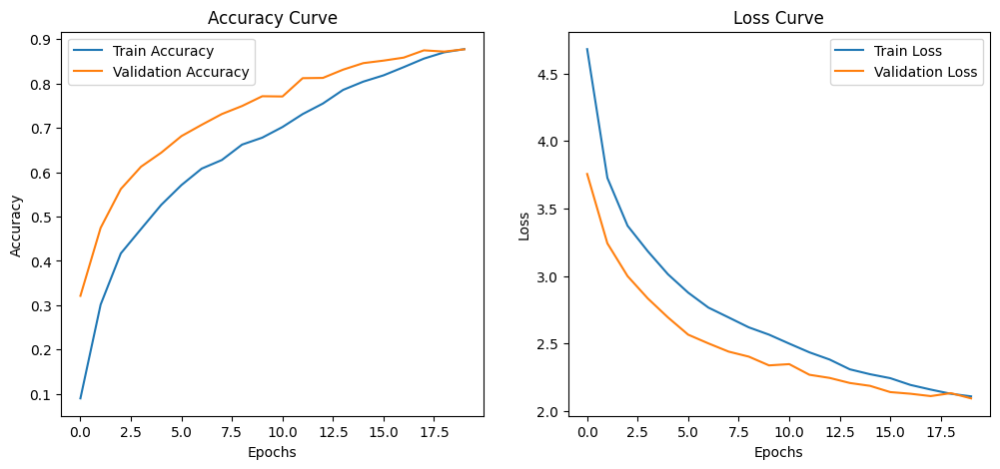

In [24]:
import matplotlib.pyplot as plt

num_epochs = 19
epochs = range(0, num_epochs + 1)
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(epochs, train_history["accuracy"], label='Train Accuracy')
plt.plot(epochs, val_history["accuracy"], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Accuracy Curve')

plt.subplot(1, 2, 2)
plt.plot(epochs, train_history["loss"], label='Train Loss')
plt.plot(epochs, val_history["loss"], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Loss Curve')

plt.show()


# Finding global mean, std of dataset

In [26]:
from torch.utils.data import DataLoader
from tqdm import tqdm

def compute_mean_std(loader):
    n_samples = 0
    channel_sum = 0
    channel_sum_sq = 0

    for inputs, _ in tqdm(loader):
        inputs = inputs.to(device)
        batch_samples = inputs.size(0)
        inputs = inputs.view(batch_samples, inputs.size(1), -1)  # Flatten H x W

        channel_sum += inputs.sum(2).sum(0)
        channel_sum_sq += (inputs ** 2).sum(2).sum(0)
        n_samples += batch_samples * inputs.size(2)

    mean = channel_sum / n_samples
    std = (channel_sum_sq / n_samples - mean ** 2).sqrt()
    return mean.cpu().numpy(), std.cpu().numpy()

# Use train_loader to compute stats
mean, std = compute_mean_std(train_loader)
print(f"Computed Mean: {mean}")
print(f"Computed Std: {std}")


100%|██████████| 35/35 [01:31<00:00,  2.61s/it]

Computed Mean: [-0.00677085  0.16426852  0.08283585]
Computed Std: [0.99591595 0.99977183 1.1544473 ]


# Grid of Sample Test Images with Predictions

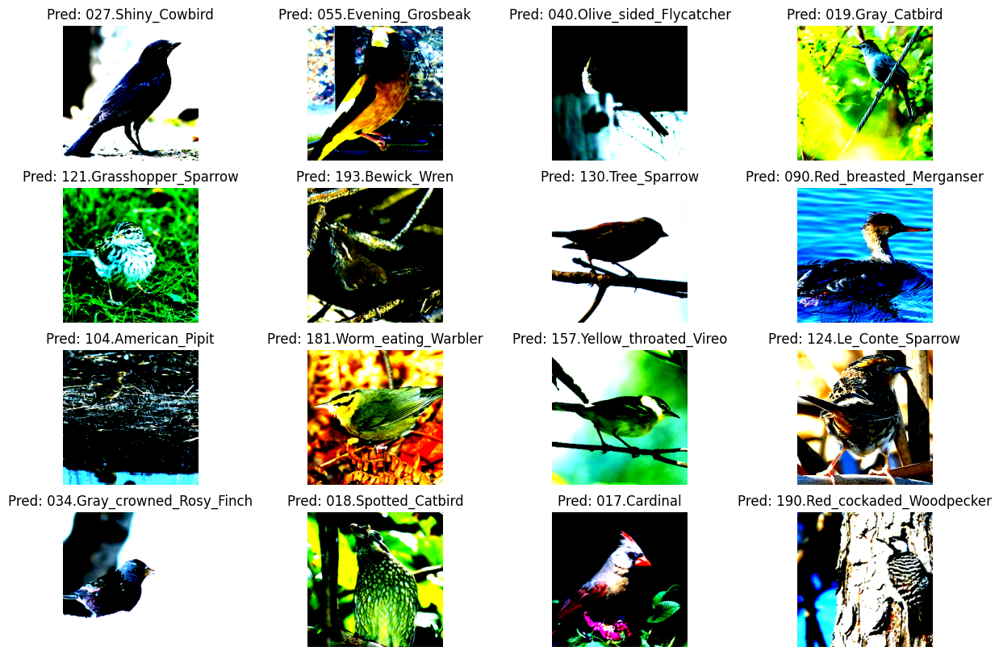

In [27]:
import numpy as np

def imshow(inp, title=None):
    inp = inp.cpu().numpy().transpose((1, 2, 0))
    mean_local = np.array(mean)
    std_local = np.array(std)
    inp = std_local * inp + mean_local
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title:
        plt.title(title)
    plt.axis('off')

# Plot a grid of test samples with predictions
model_ft.eval()
images_so_far = 0
fig = plt.figure(figsize=(15, 10))

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model_ft(inputs)
        _, preds = torch.max(outputs, 1)

        for j in range(inputs.size()[0]):
            images_so_far += 1
            ax = plt.subplot(4, 4, images_so_far)
            imshow(inputs.cpu().data[j], title=f'Pred: {classes[preds[j]]}')
            if images_so_far == 16:
                break
        if images_so_far == 16:
            break

plt.show()


# **Part B - Examine Filters and Feature Maps**

1.   Visualize First Layer Filters
2.   Visualize Feature Maps per Convolutional Layer



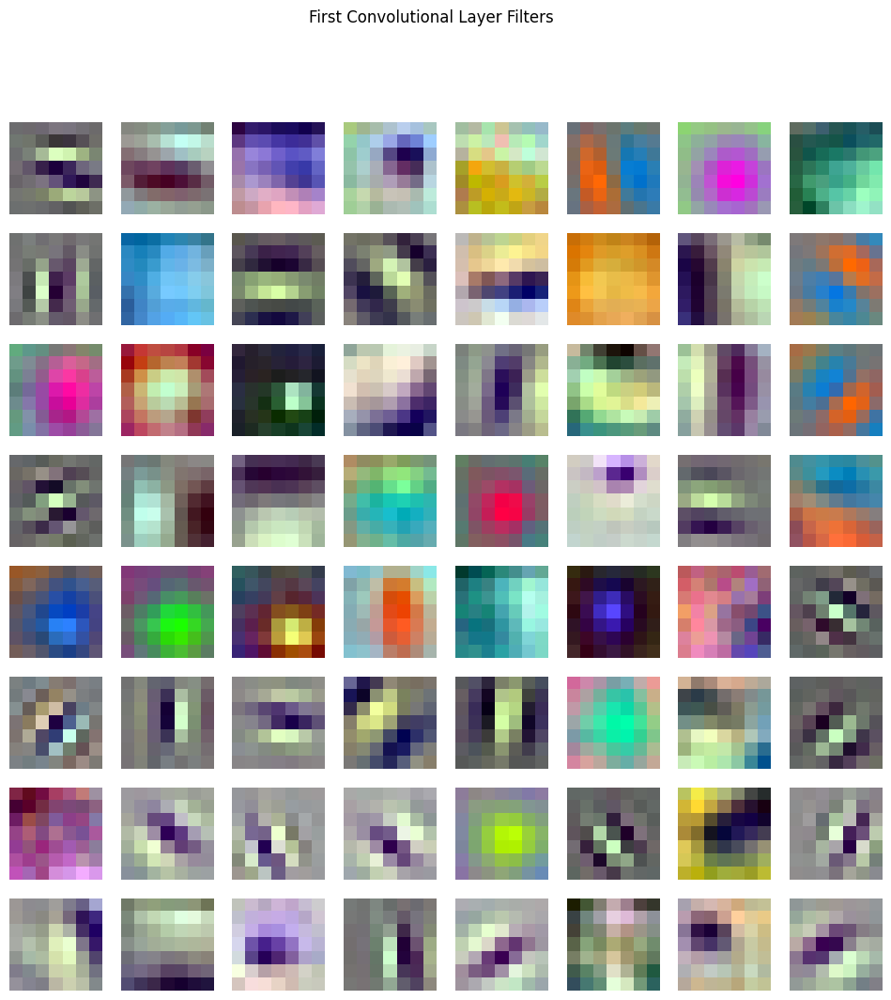

In [28]:
first_conv_weights = model_ft.conv1.weight.data.cpu()

fig, axes = plt.subplots(8, 8, figsize=(12, 12))
for i, ax in enumerate(axes.flat):
    if i < first_conv_weights.shape[0]:
        img = first_conv_weights[i].numpy().transpose((1, 2, 0))
        img = (img - img.min()) / (img.max() - img.min())  # Normalize for display
        ax.imshow(img)
    ax.axis('off')

plt.suptitle('First Convolutional Layer Filters')
plt.show()


In [32]:
dict(model_ft.named_children()).keys()

dict_keys(['conv1', 'bn1', 'relu', 'maxpool', 'layer1', 'layer2', 'layer3', 'layer4', 'avgpool', 'fc'])

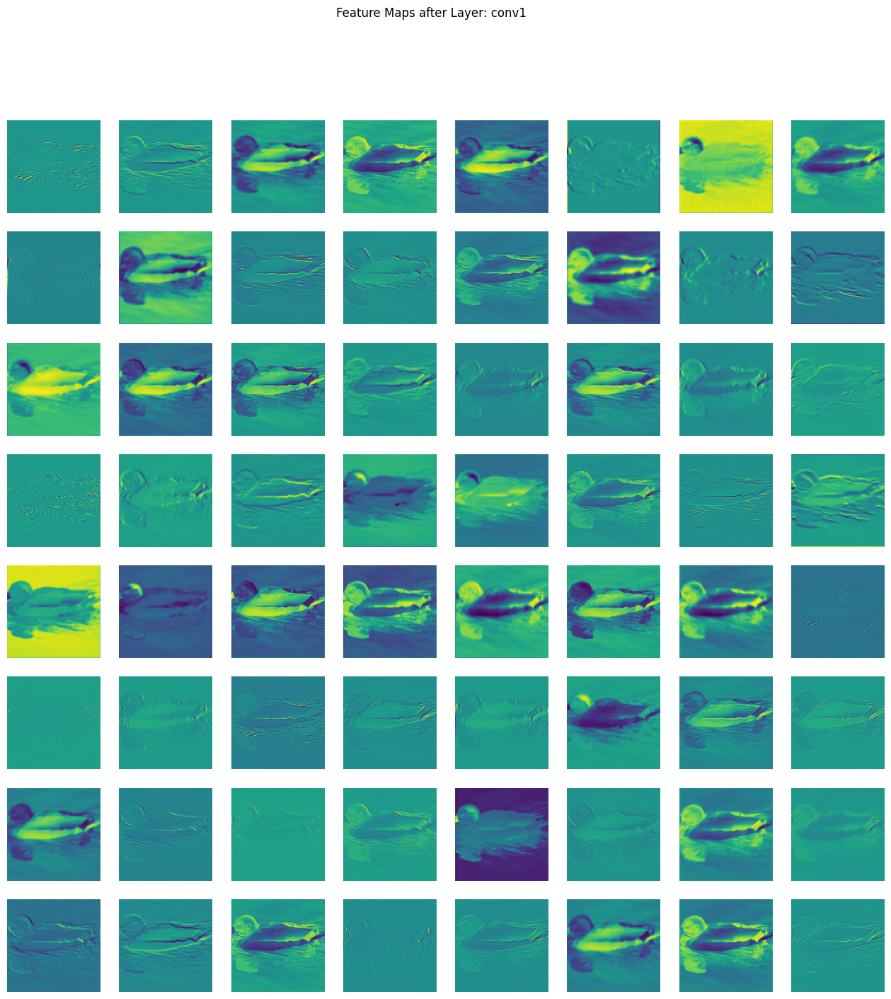

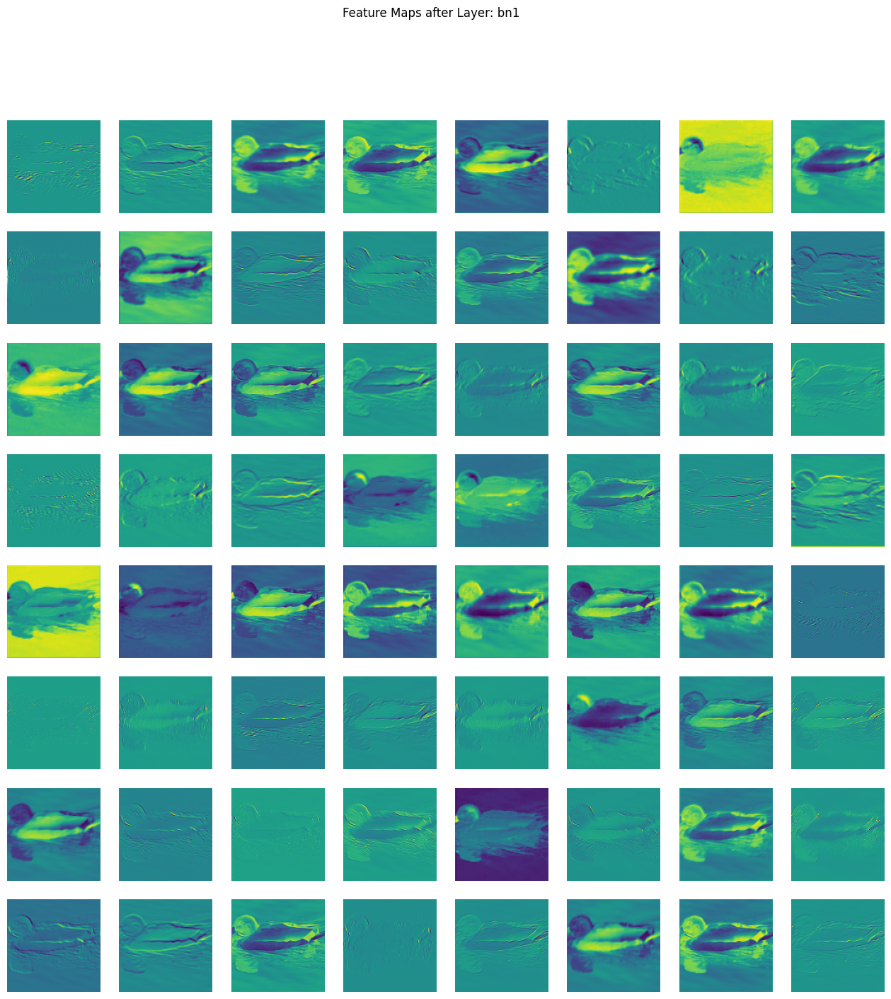

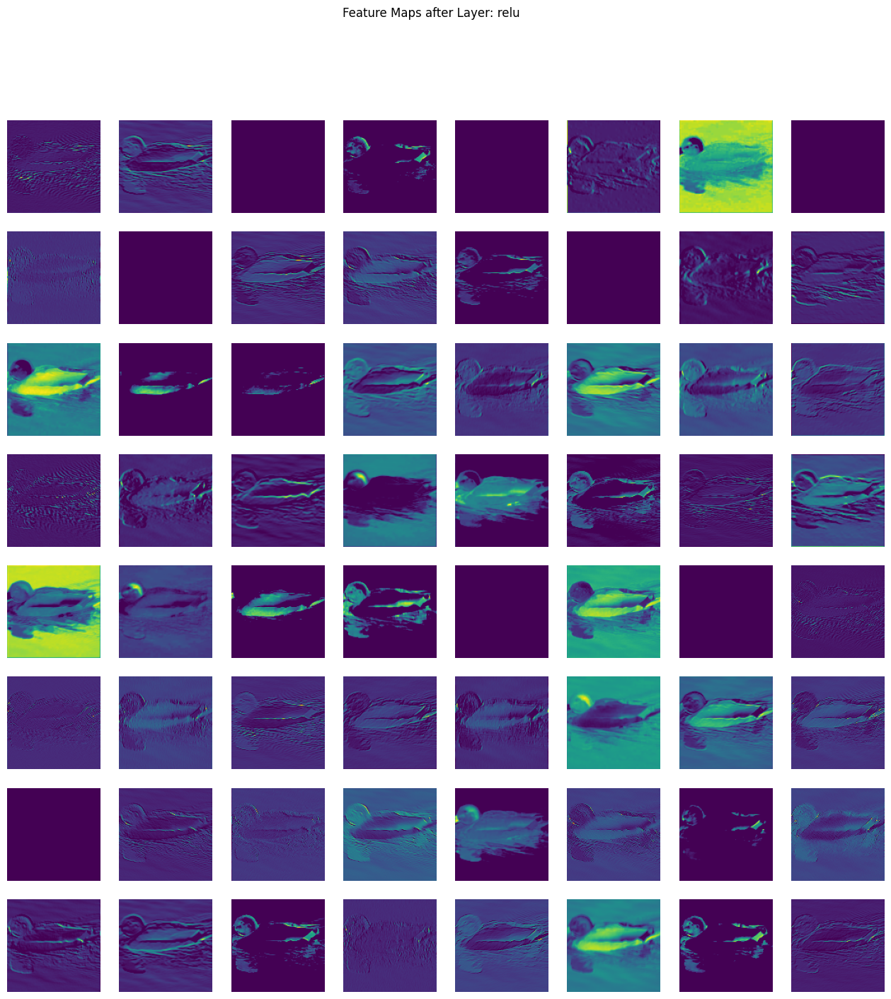

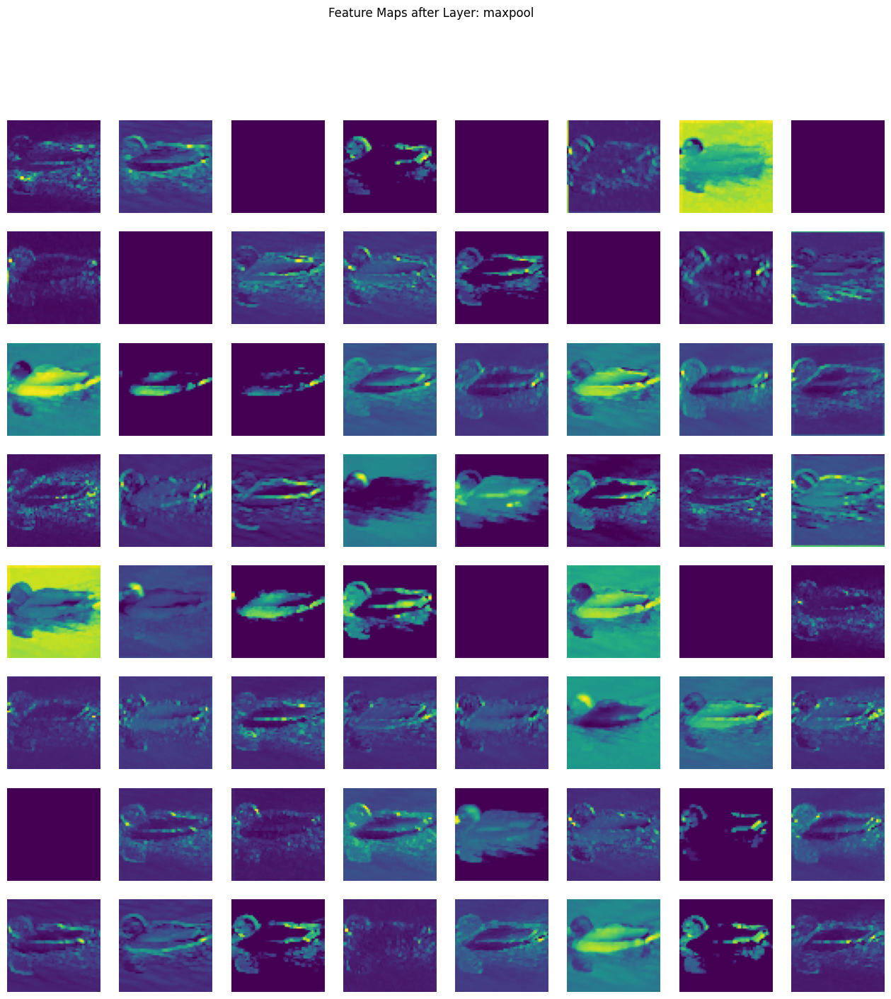

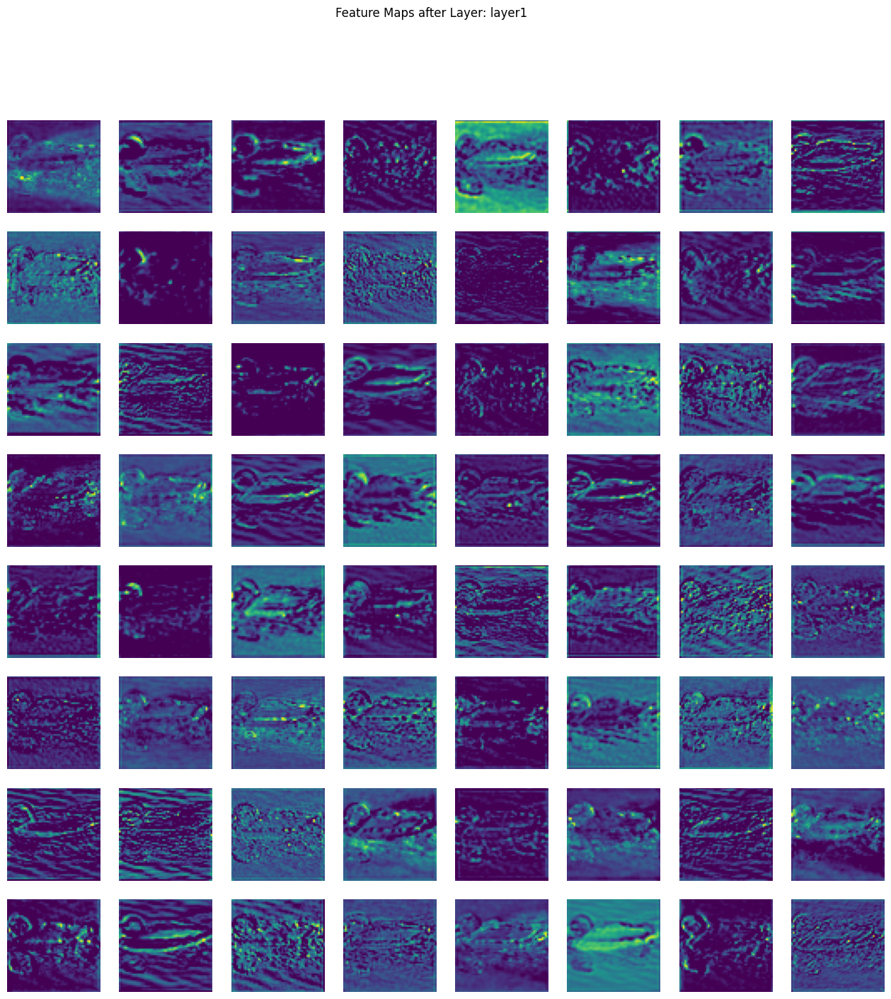

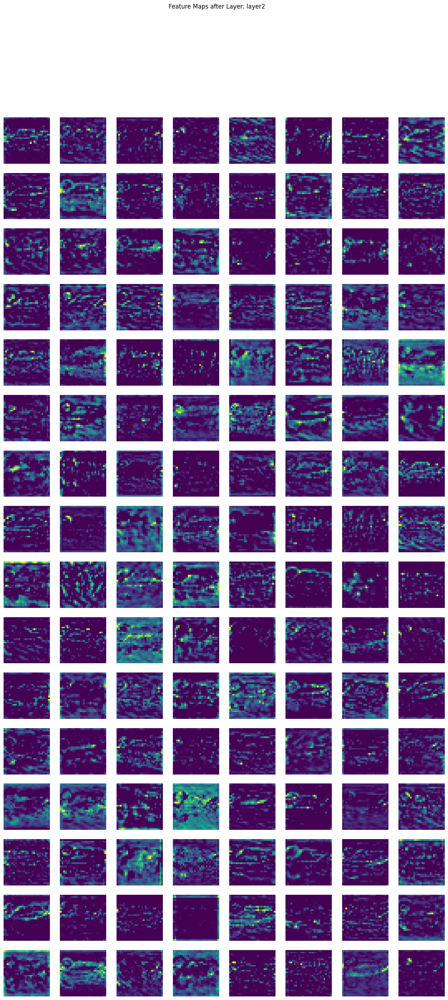

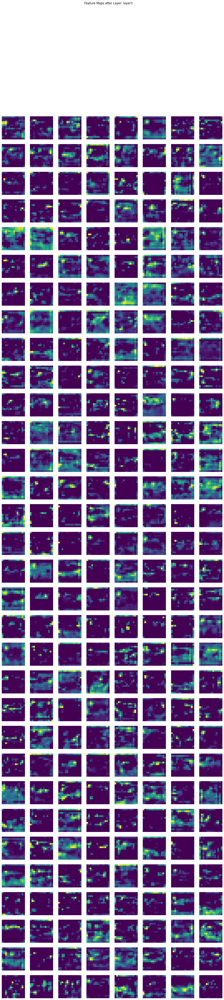

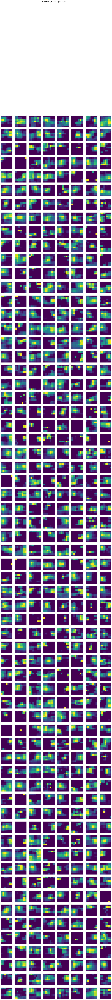

In [37]:
from torch.nn import Sequential

def visualize_feature_maps(model, layer_names, input_img):
    x = input_img.unsqueeze(0).to(device)  # Add batch dimension

    for layer_name in layer_names:
        layer = dict(model.named_children())[layer_name]
        x = layer(x)

        feature_maps = x.cpu().data.squeeze(0)  # Only remove batch dim
        num_maps = feature_maps.shape[0]

        # Determine grid size
        grid_cols = 8
        grid_rows = (num_maps + grid_cols - 1) // grid_cols

        fig, axes = plt.subplots(grid_rows, grid_cols, figsize=(grid_cols * 2, grid_rows * 2))

        # Flatten axes for easy iteration
        axes = axes.flatten() if isinstance(axes, np.ndarray) else [axes]

        for i in range(grid_rows * grid_cols):
            if i < num_maps:
                ax = axes[i]
                fmap = feature_maps[i].numpy()
                ax.imshow(fmap, cmap='viridis')
            axes[i].axis('off')

        plt.suptitle(f'Feature Maps after Layer: {layer_name}')
        plt.show()


# Select a random test image and layer names
sample_input, _ = next(iter(test_loader))
layer_names = ['conv1', 'bn1', 'relu', 'maxpool', 'layer1', 'layer2', 'layer3', 'layer4']
visualize_feature_maps(model_ft, layer_names, sample_input[0])


# **Part C – Experiment with Filter Configurations**


1.   Re-train with Different Filter Settings
2.   Plot Comparative Curves



# Re-train with Different Filter Settings

In [8]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

Configuration 2 – Fewer Filters

In [39]:
import torch.nn as nn
import torch.nn.functional as F

class FewFiltersCNN(nn.Module):
    def __init__(self, num_classes=200):
        super(FewFiltersCNN, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.AdaptiveAvgPool2d((1, 1)),
        )
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(128, num_classes),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x

model_fewer_filters = FewFiltersCNN(num_classes=200).to(device)
torch.cuda.empty_cache()

Configuration 3 – Smaller Kernel Size (3x3 instead of 7x7)

In [40]:
import torch.nn as nn
import torch.nn.functional as F

class SmallKernelCNN(nn.Module):
    def __init__(self, num_classes=200):
        super(SmallKernelCNN, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),

            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.AdaptiveAvgPool2d((1, 1)),
        )
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(256, num_classes),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x

model_small_kernel = SmallKernelCNN(num_classes=200).to(device)
torch.cuda.empty_cache()

Configuration 4 – Very Small Model (Fewer Layers)

In [24]:
import torch.nn as nn
import torch.nn.functional as F

class TinyCNNAdaptive(nn.Module):
    def __init__(self, num_classes=200):
        super(TinyCNNAdaptive, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),  # Downsample by factor of 2

            nn.Conv2d(16, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.AdaptiveAvgPool2d((1, 1)),  # Always outputs [batch, 64, 1, 1]
        )
        self.classifier = nn.Sequential(
            nn.Flatten(),  # Converts [batch, 64, 1, 1] → [batch, 64]
            nn.Linear(64, num_classes),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x

Now, training these models

In [38]:
model_tiny_fixed = TinyCNNAdaptive(num_classes=200).to(device)
torch.cuda.empty_cache()

criterion_tiny = torch.nn.CrossEntropyLoss()
optimizer_tiny = torch.optim.SGD(model_tiny_fixed.parameters(), lr=0.001, momentum=0.9)
lr_scheduler_tiny = torch.optim.lr_scheduler.StepLR(optimizer_tiny, step_size=7, gamma=0.1)

model_4 = train_model(model_tiny_fixed, criterion_tiny, optimizer_tiny, lr_scheduler_tiny, num_epochs=1)


Epoch 0/0
----------


100%|██████████| 35/35 [11:25<00:00, 19.60s/it]


train Loss: 5.3301 Acc: 0.0051


100%|██████████| 28/28 [01:10<00:00,  2.53s/it]

val Loss: 5.3096 Acc: 0.0062

Training complete in 12m 37s
Best val Acc: 0.0062


In [41]:
model_fewer_filters = FewFiltersCNN(num_classes=200).to(device)
torch.cuda.empty_cache()

criterion_fewer = torch.nn.CrossEntropyLoss()
optimizer_fewer = torch.optim.SGD(model_fewer_filters.parameters(), lr=0.001, momentum=0.9)
lr_scheduler_fewer = torch.optim.lr_scheduler.StepLR(optimizer_fewer, step_size=7, gamma=0.1)

model_2 = train_model(model_fewer_filters, criterion_fewer, optimizer_fewer, lr_scheduler_fewer, num_epochs=1)

Epoch 0/0
----------


100%|██████████| 35/35 [26:40<00:00, 45.73s/it]


train Loss: 5.3316 Acc: 0.0043


100%|██████████| 28/28 [02:15<00:00,  4.85s/it]

val Loss: 5.3138 Acc: 0.0045

Training complete in 28m 56s
Best val Acc: 0.0045


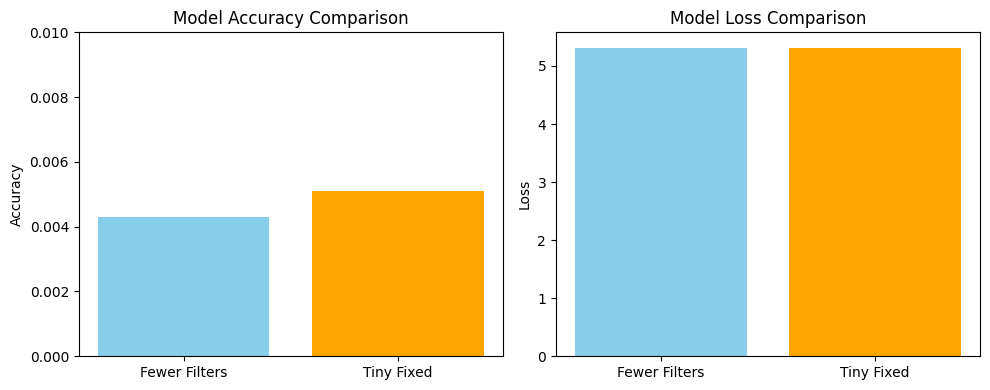

In [2]:
import matplotlib.pyplot as plt

# Accuracy and Loss values
models = ['Fewer Filters', 'Tiny Fixed']
accuracies = [0.0043, 0.0051]
losses = [5.3138, 5.3096]

# Plot Accuracy Comparison
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
plt.bar(models, accuracies, color=['skyblue', 'orange'])
plt.ylabel('Accuracy')
plt.title('Model Accuracy Comparison')
plt.ylim(0, 0.01)  # Zoom in to see small differences

# Plot Loss Comparison
plt.subplot(1, 2, 2)
plt.bar(models, losses, color=['skyblue', 'orange'])
plt.ylabel('Loss')
plt.title('Model Loss Comparison')

plt.tight_layout()
plt.show()
